### Initialization

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import tensorflow as tf
import xgboost as xgb
import os
import winsound
import warnings
import xml.etree.ElementTree as ET
from tensorflow.keras.layers import Dense, LSTM, Conv1D, MaxPooling1D, ConvLSTM1D, TimeDistributed, Flatten, Dropout, RepeatVector, Activation, ReLU, BatchNormalization
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn import metrics
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.preprocessing.sequence import TimeseriesGenerator

from math import sqrt

%matplotlib inline

### Creating data

In [ ]:
def create_dataframe_from_xml(xml_folder, root_element):
    df = pd.DataFrame() 

    for filename in os.listdir(xml_folder):
        if filename.endswith(".xml"):
            xml_file = os.path.join(xml_folder, filename)

            try:
                # Analizza il file XML
                tree = ET.parse(xml_file)
                root = tree.getroot()

                # Inizializza una lista per memorizzare i dati
                data = []

                # Itera sugli elementi desiderati nel file XML
                for element in root.findall(f'.//{root_element}'):
                    data_dict = {}
                    for child in element:
                        data_dict[child.tag] = child.text
                    data.append(data_dict)

                # Crea un DataFrame dai dati del file XML
                temp_df = pd.DataFrame(data)

                # Aggiungi il DataFrame del file corrente al DataFrame principale
                df = pd.concat([df, temp_df], ignore_index=True)
            
            except ET.ParseError as e:
                print(f"Errore durante il parsing del file {xml_file}: {e}")

    return df



In [ ]:
# Conta i valori NaN nel dataframe
def nan_counts_func(df):
    nan_counts = df.isna().sum()

    # Trova le colonne con valori NaN (se ce ne sono)
    columns_with_nan = nan_counts[nan_counts > 0]

    if columns_with_nan.empty:
        print("Nessun valore NaN nel DataFrame.")
    else:
        print("Colonne con valori NaN:")
        print(columns_with_nan)
    

In [25]:
df_price = create_dataframe_from_xml("data_prices", 'Prezzi')

In [41]:
df_stime = create_dataframe_from_xml("data_stimafabbisogno", 'marketintervaldetail')

In [28]:
df_gas = create_dataframe_from_xml('data_gas', 'negoziazione_continua')

In [29]:
df_demand = create_dataframe_from_xml("data_fabbisogno", 'Fabbisogno')

#### Data preprocessing

#### GAS

In [30]:
df_temp = df_gas.groupby('NomeProdotto')['PrezzoMedio'].last().reset_index()
df_temp.columns = ['NomeProdotto', 'GAS']
df_temp['NomeProdotto'] = df_temp['NomeProdotto'].str.replace('MGP-', '')
df_temp['NomeProdotto'] = df_temp['NomeProdotto'].str.replace('WE-', '')


In [32]:
df_temp = df_temp.iloc[:2176]
# df_temp = df_temp.iloc[:31,]
df_temp['DataG'] = pd.to_datetime(df_temp['NomeProdotto'])
df_temp = df_temp[['DataG', 'GAS']]
df_temp['GAS'] = pd.to_numeric(df_temp['GAS'], errors='coerce')


In [33]:
df_temp = df_temp.loc[df_temp.index.repeat(24)].reset_index(drop=True)

In [15]:
# plt.figure(figsize=(16, 6))
# plt.plot(df_temp['DataG'], df_temp['GAS'], marker='.', linestyle='-', color='b', linewidth=1)

# plt.title('GAS prezzo medio')
# plt.xlabel('Data')
# plt.ylabel('Prezzo Medio')
# plt.show()

#### Concateno i dataset

In [61]:
df = pd.concat([df_price['Data'], df_price['Ora'], df_price['PUN'], df_stime['Totale'], df_temp, df_demand['Italia']], axis=1)

In [62]:
df['Ora'] = pd.to_numeric(df['Ora'])
df['Data'] = pd.to_datetime(df['Data'])
df['PUN'] = df['PUN'].str.replace(',', '.').astype(float)
df['Totale'] = df['Totale'].str.replace(',', '.').astype(float)
df['Italia'] = df['Italia'].str.replace(',', '.').astype(float)

In [63]:
df.rename(columns={'Totale': 'Total_load_f'}, inplace=True)
df = df.drop(columns='DataG', axis=1)
df = df.dropna()

#### Aggiungo features temporali

In [64]:
def split_temporal_indices(df):
    # Estrai l'anno, il mese, il giorno della settimana e l'ora dalla colonna 'DataCompleta'
    # df['Mese'] = df['Data'].dt.month
    df['GiornoSettimana'] = df['Data'].dt.dayofweek
    df['Weekend'] = df['GiornoSettimana'].apply(lambda x: 1 if x > 5 else 0)  # 5 e 6 rappresentano sabato e domenica
    
    return df

df = split_temporal_indices(df)


In [65]:
ora_column = df.pop('Ora') 
df['Ora'] = ora_column
df['Ora'] = df['Ora'].astype(int)

In [66]:
# df.reset_index(inplace=True)

df['Time_data'] = df['Data'].apply(lambda t: pd.Timestamp(t).normalize().tz_localize('CET').tz_convert('UTC')) + \
                    df['Ora'].apply(lambda h: pd.Timedelta(hours=h))

df.set_index('Time_data', inplace=True)

In [67]:
from datetime import date
from workalendar.europe import Italy

years = list(range(2018, 2024))  # 2018 incluso, 2024 escluso
holiday_dates = []

for year in years:
    holidays_year = Italy().holidays(year)
    holiday_dates.extend([date for date, _ in holidays_year])

In [68]:
holiday_dates_str = [date.strftime('%Y-%m-%d') for date in holiday_dates]

# crea un indice date time index
date_range = pd.date_range(start="2018-01-01", end="2023-12-14", freq='H')


df_holiday = pd.DataFrame(index=date_range)

# Add a column 'is_holiday' and set values based on holiday_dates_str
df_holiday['is_holiday'] = df_holiday.index.strftime('%Y-%m-%d').isin(holiday_dates_str).astype(int)


In [70]:
# Applico la stessa timezone a df_holiday
df_holiday.index = df_holiday.index.tz_localize(df.index.tz)

df = pd.merge(df, df_holiday, left_index=True, right_index=True, how='left')

df['is_holiday'] = df['is_holiday'].astype(int)

df['holiday'] = df['is_holiday'] | df['Weekend'] # operatore come l' OR 

#### Related features

In [71]:
tmp = df['PUN'].shift(1, freq = pd.DateOffset(days=-1))

df['PUN_d+1-7'] = tmp.shift(1, freq = pd.DateOffset(weeks=1))

df['PUN_d+1-14'] = tmp.shift(1, freq = pd.DateOffset(weeks=2))

df['GAS_d+1'] = df['GAS'].shift(1, freq = pd.DateOffset(days=-1))

df['GAS_d+1-7'] = df['GAS_d+1'].shift(1, freq = pd.DateOffset(weeks=1))

df['Total_Load_d+1-7'] = df['Italia'].shift(1, freq = pd.DateOffset(days=6))

In [72]:
df.dropna(inplace=True)

In [73]:
df.drop(columns='Data', axis=1, inplace=True)
df.drop(columns=['Weekend'], axis=1, inplace=True)
# df.drop(columns='PUN_d+1', axis=1, inplace=True)

In [641]:
# df.drop(columns=['Ora_sin', 'Ora_cos'], axis=1, inplace=True)
# df.drop(columns='Ora', axis=1, inplace=True)

In [74]:
df = df.round(2)

In [75]:
df = df[["PUN", "PUN_d+1-7", "PUN_d+1-14", "GAS", "GAS_d+1-7", "Total_load_f", "Total_Load_d+1-7", "GiornoSettimana", 'Ora', 'holiday' ]]

In [77]:
df.tail()

,PUN,PUN_d+1-7,PUN_d+1-14,GAS,GAS_d+1-7,Total_load_f,Total_Load_d+1-7,GiornoSettimana,Ora,holiday
Time_data,,,,,,,,,,
2023-11-07 19:00:00+00:00,167.02,158.11,142.35,42.15,38.54,42197.0,36289.52,1,20,0
2023-11-07 20:00:00+00:00,132.16,146.76,130.55,42.15,38.54,40003.0,34429.66,1,21,0
2023-11-07 21:00:00+00:00,127.06,121.55,130.55,42.15,38.54,37063.0,31412.46,1,22,0
2023-11-07 22:00:00+00:00,123.44,85.54,129.70,42.15,38.54,33188.0,28461.51,1,23,0
2023-11-07 23:00:00+00:00,118.79,41.75,129.42,42.15,38.54,30031.0,25871.82,1,24,0


In [78]:
df.to_csv("all_data.csv", index=True)

### Importing data

In [2]:
df = pd.read_csv('all_data.csv')

In [3]:
df.set_index('Time_data', inplace=True)
df.index = pd.to_datetime(df.index)

In [81]:
# df_2021_22 = df[(df.index.year >= 2021) & (df.index.year < 2023)]

# df_2022 = df[df.index.year == 2022]

# df_2021 = df[df.index.year == 2021]

# df_2023 = df[df.index.year >= 2023]

In [4]:
df_PUN = df.iloc[:, :3]
df_GAS = df.iloc[:, :5]
df_total_load = df.iloc[:, :7]
df_PUN7 = df.iloc[:,:2]

La media per ottobre 2023 è: 134.29083333333335


Text(0.5, 1.0, 'PUN hourly price for October and November 2023')

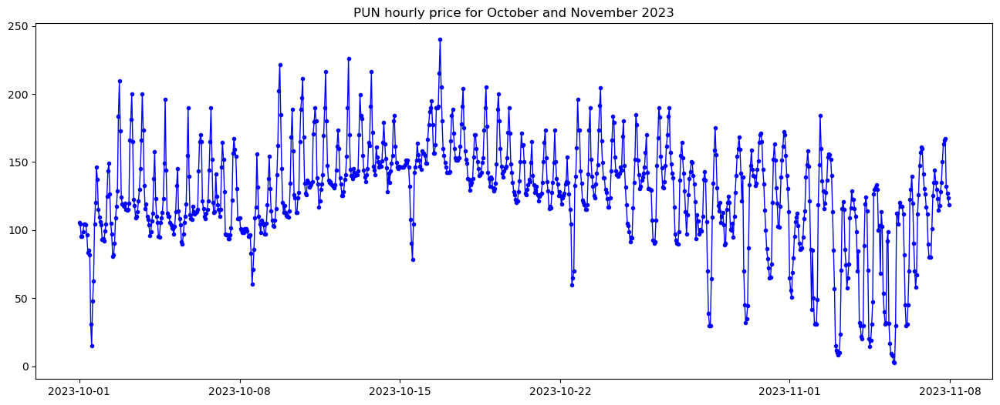

In [131]:
df_oct_nov_2023 = df['PUN'][(df.index.month >= 10) & (df.index.month < 12) & (df.index.year == 2023)]


media_ott_2023 = df['PUN'][(df.index.month == 10) & (df.index.year == 2023)].mean()
print(f"La media per ottobre 2023 è: {media_ott_2023} €/Kwh")


plt.figure(figsize=(16, 6))
plt.plot(df_oct_nov_2023, marker='.', linestyle='-', color='b', linewidth=1)
plt.title('PUN hourly price for October and November 2023')

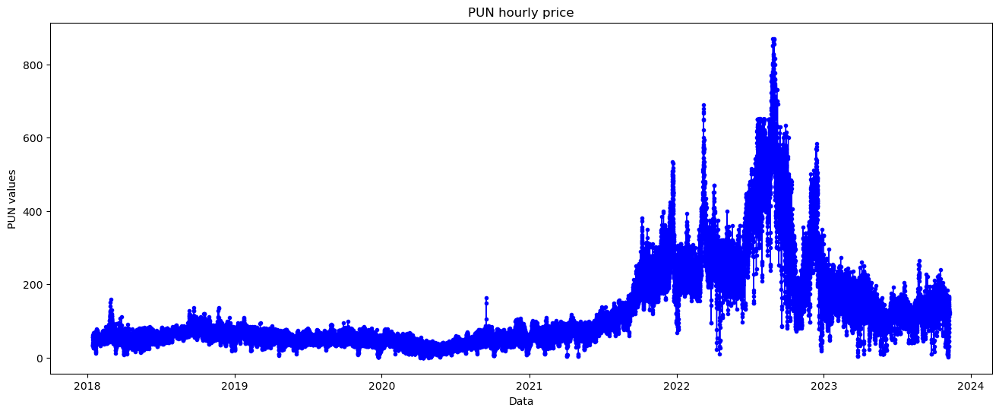

In [126]:
plt.figure(figsize=(16, 6))
plt.plot(df['PUN'], marker='.', linestyle='-', color='b', linewidth=1)

plt.title('PUN hourly price')
plt.xlabel('Data')
plt.ylabel('PUN values')
plt.show()

## Feature selection

#### Defining stuff

In [6]:
def yearly_dataset(df, year):
    return df[df.index.year == year]

In [7]:
def transform_time_features(data, normalization):
    radians = 2 * np.pi * data / normalization
    return np.sin(radians), np.cos(radians)


In [8]:
from tensorflow.keras.utils import get_custom_objects
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Activation

def custom_activation(x, beta = 1):
        return (K.sigmoid(beta * x) * x)

get_custom_objects().update({'custom_activation': Activation(custom_activation)})

# model.add(Activation(custom_activation,name = "Swish"))

In [9]:
def multivariate_data(dataset, target, start_index, end_index, history_size,
                             target_size, step, single_step=False):

    data = []
    labels = []

    # Aggiusta l'indice di partenza in base alla dimensione della storia
    # start_index = start_index + history_size

    if start_index is None:
        start_index = 0

    # Imposta l'indice di fine se non è specificato
    if end_index is None:
        end_index = len(dataset) - target_size
        
    
    for i in range(start_index, end_index, step):
        indices = range(i, i + history_size)
        data.append(dataset[indices])
        
        # Aggiunge l'etichetta in base al tipo di previsione
        if single_step:
            labels.append(target[i + history_size + target_size])
        else:
            labels.append(target[i + history_size: i + history_size + target_size])

        # check if we are beyond the dataset
        if i + history_size > len(dataset) - target_size - history_size:
            break
    

    return np.array(data), np.array(labels)

In [10]:
def plot_model_rmse_and_loss(history):
    
    # Evaluate train and validation accuracies and losses
    
    train_rmse = history.history['root_mean_squared_error']
    val_rmse = history.history['val_root_mean_squared_error']
    
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    # Visualize epochs vs. train and validation accuracies and losses
    
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.plot(train_rmse, label='Training RMSE')
    plt.plot(val_rmse, label='Validation RMSE')
    plt.legend()
    plt.title('Epochs vs. Training and Validation RMSE')
    
    plt.subplot(1, 2, 2)
    plt.plot(train_loss, label='Training Loss')
    plt.plot(val_loss, label='Validation Loss')
    plt.legend()
    plt.title('Epochs vs. Training and Validation Loss')
    
    plt.show()

In [123]:
def single_timeseries_evaluation_metrics_func(y_true, y_pred):
    
    def mean_absolute_percentage_error(y_true, y_pred): 
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

    mse = metrics.mean_squared_error(y_true, y_pred)
    mae = metrics.mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    nmae = normalize_mean_absolute_error(y_true, y_pred)

    dec = 3 # cifra di approssimazione

    print('Evaluation metric results:-')
    print(f'MAE is : {round(mae, dec)}')
    print(f'RMSE is : {round(rmse, dec)}')
    print(f'MAPE is : {round(mape, dec)}')
    print(f'NMAE is : {round(nmae, dec)}')
    # print(f'R2 is : {round(metrics.r2_score(y_true, y_pred), 2)}', end='\n\n')




In [12]:
# Vecchio e sbagliato
# def timeseries_evaluation_metrics_func(y_true, y_pred):
#     def mean_absolute_percentage_error(y_true, y_pred):
#         mask = y_true != 0  # Crea una maschera per evitare divisione per zero
#         y_true_masked = y_true[mask]
#         y_pred_masked = y_pred[mask]
#         return np.mean(np.abs((y_true_masked - y_pred_masked) / y_true_masked)) * 100

#     def normalize_mean_absolute_error(y_true, y_pred):
#         y_true, y_pred = np.array(y_true), np.array(y_pred)
#         return metrics.mean_absolute_error(y_true, y_pred)/np.mean(np.abs(y_true))
   
#     mae_values = []
#     rmse_values = []
#     mape_values = []
#     nmae_values = []
#     dec = 3 #cifre decimali
    
#     for col_idx in range(y_true.shape[1]):
#         col_true = y_true[:, col_idx]
#         col_pred = y_pred[:, col_idx]
        
        
#         mae_values.append(metrics.mean_absolute_error(col_true, col_pred))
#         rmse_values.append(np.sqrt(metrics.mean_squared_error(col_true, col_pred)))
#         mape_values.append(mean_absolute_percentage_error(col_true, col_pred))
#         nmae_values.append(normalize_mean_absolute_error(col_true, col_pred))

#     print('Evaluation metric results:')
#     print(f'MAE is : {round(np.mean(mae_values), dec)}')
#     print(f'RMSE is : {round(np.mean(rmse_values), dec)}')
#     print(f'MAPE is : {round(np.mean(mape_values), dec)}')
#     print(f'NMAE is : {round(np.mean(nmae_values), dec)}', end='\n\n')


In [13]:
def visual_single_representation(y_true, y_pred):
    plt.figure(figsize=(16, 6))
    plt.plot(y_true, linewidth=0.7, label='Actual')
    plt.plot(y_pred, linewidth=0.7, color='r', label='Forecast')

    plt.xlabel('Date')
    plt.ylabel('PUN forecasting')
    plt.title('Raw Data and Prediction')
    plt.legend()
    plt.show()

In [14]:
def plot_model_loss(history):
    
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    # Visualize epochs vs. train and validation accuracies and losses
    
    plt.figure(figsize=(16, 8))
    plt.plot(train_loss, label='Training Loss')
    plt.plot(val_loss, label='Validation Loss')
    plt.legend()
    plt.title('Epochs vs. Training and Validation Loss')
    
    plt.show()

In [15]:
def plot_error_metrics(error_table):
    # Creazione dei subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 4))

    # Plot per NMAE
    ax1.scatter(error_table['Column'], error_table['NMAE'], label='NMAE', alpha=0.7, marker='o')
    ax1.set_xlabel('Columns')
    ax1.set_ylabel('NMAE')
    ax1.set_title('NMAE for Each Column')
    ax1.legend()

    # Plot per MAE, RMSE, MAPE
    ax2.scatter(error_table['Column'], error_table['RMSE'], label='RMSE', alpha=0.7, marker='o')
    ax2.scatter(error_table['Column'], error_table['MAPE'], label='MAPE', alpha=0.7, marker='o')
    ax2.set_xlabel('Columns')
    ax2.set_ylabel('Errors')
    ax2.set_title('RMSE and MAPE for Each Column')
    ax2.legend()

    # Trova il minimo di NMAE, RMSE e MAPE
    min_nmae_row = error_table.loc[error_table['NMAE'].idxmin()]
    min_rmse_row = error_table.loc[error_table['RMSE'].idxmin()]
    min_mape_row = error_table.loc[error_table['MAPE'].idxmin()]

    # Stampa i minimi e le relative colonne
    print("Min NMAE:", min_nmae_row['NMAE'], "for Column:", min_nmae_row['Column'])
    print("Min RMSE:", min_rmse_row['RMSE'], "for Column:", min_rmse_row['Column'])
    print("Min MAPE:", min_mape_row['MAPE'], "for Column:", min_mape_row['Column'])


    plt.tight_layout()
    plt.show()


In [122]:
def evaluation_metrics_func(y_true, y_pred):
    def mean_absolute_percentage_error(y_true, y_pred): 
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

    
    def normalize_mean_absolute_error(y_true, y_pred):
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return metrics.mean_absolute_error(y_true, y_pred) / np.mean(np.abs(y_true))

    mse = metrics.mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    nmae = normalize_mean_absolute_error(y_true, y_pred)

    dec = 3  # cifra di approssimazione

    result = {
        'RMSE': round(rmse, dec),
        'MAPE': round(mape, dec),
        'NMAE': round(nmae, dec)
    }

    return result


In [17]:
def evaluate_and_plot_timeseries(y_test_inv, forecast, show_plot=False):
    # locals()['error_list' + forecast] = []
    error_list = []

    if show_plot:
        fig, axes = plt.subplots(y_test_inv.shape[1], 1, figsize=(16, 4 * y_test_inv.shape[1]))

    for col_idx in range(forecast.shape[1]):
        col_true = y_test_inv[:, col_idx]
        col_pred = forecast[:, col_idx]

        # Calcola le metriche per la colonna corrente
        metrics_result = evaluation_metrics_func(col_true, col_pred)

        # Estrai gli errori dalla risultato della funzione
        rmse, mape, nmae = metrics_result.values()

        # Aggiungi gli errori alla lista
        error_list.append({'Column': col_idx, 'RMSE': rmse, 'MAPE': mape, 'NMAE': nmae})

        # Plot per la colonna corrente (Actual vs Forecast)
        if show_plot:
            axes[col_idx].plot(col_true, linewidth=0.7, label='Actual')
            axes[col_idx].plot(col_pred, linewidth=0.7, color='r', label=f'Forecast (Column {col_idx})')
            axes[col_idx].set_xlabel('Date')
            axes[col_idx].set_ylabel(f'PUN forecasting (Column {col_idx})')
            axes[col_idx].set_title(f'Raw Data and Prediction (Column {col_idx})')
            axes[col_idx].legend()

    # Converti la lista in DataFrame alla fine
    error_table = pd.DataFrame(error_list)

    
    # # Mostra i plot
    # plt.tight_layout()
    # plt.show()
    
    return error_table
    


In [18]:
def plot_error_metrics_barchart(error_table):
    # Creazione dei subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 4))

    # Grafico a barre per NMAE
    ax1.bar(error_table['Column'], error_table['NMAE'], color='blue', alpha=0.7)
    ax1.set_xlabel('Columns')
    ax1.set_ylabel('NMAE')
    ax1.set_title('NMAE for Each Column')

    # Grafico a barre per MAE, RMSE, MAPE
    # ax2.bar(error_table['Column'] - 0.2, error_table['MAE'], width=0.2, color='green', label='MAE', alpha=0.7)
    ax2.bar(error_table['Column'], error_table['RMSE'], width=0.2, color='orange', label='RMSE', alpha=0.7)
    ax2.bar(error_table['Column'] + 0.2, error_table['MAPE'], width=0.2, color='red', label='MAPE', alpha=0.7)
    ax2.set_xlabel('Columns')
    ax2.set_ylabel('Errors')
    ax2.set_title('RMSE and MAPE for Each Column')
    ax2.legend()

    # Trova il minimo di NMAE, RMSE e MAPE
    min_nmae_row = error_table.loc[error_table['NMAE'].idxmin()]
    min_rmse_row = error_table.loc[error_table['RMSE'].idxmin()]
    min_mape_row = error_table.loc[error_table['MAPE'].idxmin()]

    # Stampa i minimi e le relative colonne
    print("Min NMAE:", min_nmae_row['NMAE'], "for Column:", min_nmae_row['Column'])
    print("Min RMSE:", min_rmse_row['RMSE'], "for Column:", min_rmse_row['Column'])
    print("Min MAPE:", min_mape_row['MAPE'], "for Column:", min_mape_row['Column'])
    print((min_nmae_row['NMAE'], min_nmae_row['RMSE'], min_nmae_row['MAPE']))
    plt.tight_layout()
    plt.show()


# Forecasting

In [19]:
# dataset_input = df 
dataset_input = df

### Benchmark model 0: P_d+1 = P_d

In [20]:
df_benchmark0 = dataset_input

In [26]:
df_benchmark0['PUN_d+1'] = df['PUN'].shift(1, freq = pd.DateOffset(days=-1))

In [27]:
df_benchmark0 = df_benchmark0[['PUN', 'PUN_d+1']]

In [28]:
df_benchmark0.index.dayofweek == 6

array([False, False, False, ..., False, False, False])

In [29]:
# df_benchmark0 = df_benchmark0.loc[df_benchmark0.index.dayofweek == 3, ['PUN', 'PUN_d+1']] 

In [30]:
df_benchmark0.dropna(inplace=True)

C:\Users\Giova\AppData\Local\Temp\ipykernel_12096\2240528895.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_benchmark0.dropna(inplace=True)


NameError: name 'datetime' is not defined

Evaluation metric results:-
MAE is : 16.548
RMSE is : 23.141
MAPE is : 18.638
NMAE is : 0.13


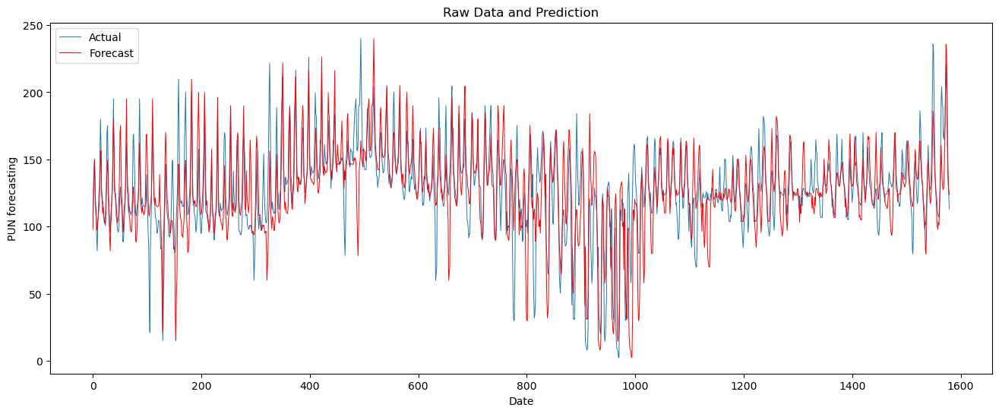

In [53]:
single_timeseries_evaluation_metrics_func(df_benchmark0['PUN_d+1'].values, df_benchmark0['PUN'].values)

# A visual representation
plt.figure(figsize=(16, 6))
plt.plot(df_benchmark0['PUN_d+1'].values, linewidth=0.7, label='Actual')
plt.plot(df_benchmark0['PUN'].values, linewidth=0.7, color='r', label='Forecast')

plt.xlabel('Date')
plt.ylabel('PUN forecasting')
plt.title('Raw Data and Prediction')
plt.legend()
plt.show()

In [54]:
# Evaluation metric results df:-
# MSE is : 390.7089968387355
# MAE is : 13.362921168467388
# RMSE is : 19.766360232443795
# MAPE is : 15.646452014736065
# NMAE is : 0.11596512455647011


# Evaluation metric results df_2023:-
# MSE is : 1244.7150953836558
# MAE is : 25.371097941359952
# RMSE is : 35.28052005545916
# MAPE is : 10.955541612542623
# NMAE is : 0.11042939304775916

### Benchmark model 1: 3 days avarage

In [55]:
df_benchmark0['Avarage_1dayPUN'] = df_benchmark0['PUN'].shift(1).rolling(window=24).mean()

C:\Users\Giova\AppData\Local\Temp\ipykernel_4516\2269233400.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_benchmark0['Avarage_1dayPUN'] = df_benchmark0['PUN'].shift(1).rolling(window=24).mean()


In [56]:
df_benchmark0.dropna(inplace=True)

C:\Users\Giova\AppData\Local\Temp\ipykernel_4516\2240528895.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_benchmark0.dropna(inplace=True)


In [57]:
df_benchmark0

,PUN,PUN_d+1,Avarage_1dayPUN
Time_data,,,
2023-09-26 04:00:00+00:00,107.99,118.51,117.611667
2023-09-26 05:00:00+00:00,125.74,137.77,118.027917
2023-09-26 06:00:00+00:00,140.00,170.00,118.283750
2023-09-26 07:00:00+00:00,149.37,175.00,118.319167
2023-09-26 08:00:00+00:00,138.04,145.79,118.287500
...,...,...,...
2023-11-29 19:00:00+00:00,200.00,180.00,141.010833
2023-11-29 20:00:00+00:00,161.00,140.32,142.594583
2023-11-29 21:00:00+00:00,139.01,131.10,143.310000


Evaluation metric results:-
MAE is : 20.352
RMSE is : 27.241
MAPE is : 27.462
NMAE is : 0.16


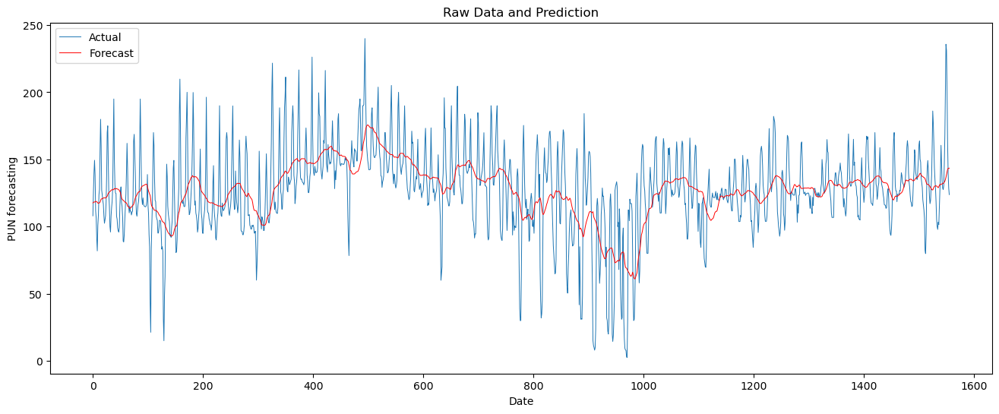

In [58]:
single_timeseries_evaluation_metrics_func(df_benchmark0['PUN'].values, df_benchmark0['Avarage_1dayPUN'].values)

# A visual representation
plt.figure(figsize=(16, 6))
plt.plot(df_benchmark0['PUN'].values, linewidth=0.7, label='Actual')
plt.plot(df_benchmark0['Avarage_1dayPUN'].values, linewidth=0.7, color='r', label='Forecast')

plt.xlabel('Date')
plt.ylabel('PUN forecasting')
plt.title('Raw Data and Prediction')
plt.legend()
plt.show()

### Benchmark model 2: Univariate

In [21]:
# Definisci una funzione per preparare i dati
def prepare_data(data, history_size, target_size, step):
    X, y = [], []
    for i in range(0, len(data) - history_size - target_size, step):
        X.append(data[i:i+history_size])
        y.append(data[i+history_size:i+history_size+target_size])
    return np.array(X), np.array(y)

# # Definisci una funzione per preparare i dati
# def prepare_data(data, history_size, target_size):
#     X, y = [], []
#     for i in range(history_size, len(data) - target_size):
#         X.append(data[i-history_size:i])
#         y.append(data[i:i+target_size])
#     return np.array(X), np.array(y)



In [72]:
dataset_input = df[df.index.year <= 2020]
# dataset_input = df[df.index.year > 2020]

data = dataset_input['PUN'].values.reshape(-1, 1)
# data = dataset_input['PUN'].values


In [73]:
scaler = MinMaxScaler()


train_data, test_data = train_test_split(data, test_size=0.4, shuffle=False)

train_data_scaled = scaler.fit_transform(train_data)
test_data_scaled = scaler.fit_transform(test_data)

In [75]:
history_size = 24 
target_size = 24
step = 1

X_train, y_train = prepare_data(train_data_scaled, history_size=history_size, target_size=target_size, step = step)
X_test, y_test = prepare_data(test_data_scaled, history_size=history_size, target_size=target_size, step = step)

In [65]:
# LSTM network expects the input data(X) to be [samples, time steps, features] format
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)


X_train shape: (14894, 72, 1)
y_train shape: (14894, 24, 1)
X_test shape: (9898, 72, 1)
y_test shape: (9898, 24, 1)


### Single trial

In [38]:
tf.keras.backend.clear_session()

# Crea il modello LSTM
model = tf.keras.Sequential()
# return_sequences: Boolean. Whether to return the last output in the output sequence, 
# or the full sequence. Default: False.
model.add(LSTM(150, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(0.2))

# model.add(LSTM(150))
# model.add(Dropout(0.2))

model.add(Dense(y_train.shape[1]))  # Output layer ha un neurone per ogni ora da prevedere


In [39]:
# Definisci il callback EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=7, min_delta=0.0002, restore_best_weights=True)

model.compile(optimizer='adam', loss='mean_squared_error')
univariate_history = model.fit(X_train, y_train, epochs=40,
                                batch_size=64, validation_split=0.2, 
                                callbacks = [early_stopping])

# A batch of data is a fixed-sized number of rows from the training dataset that defines
# how many patterns to process before updating the weights of the network

Epoch 1/40


190/190 [==============================] - 27s 129ms/step - loss: 0.0129 - val_loss: 0.0048
Epoch 2/40
190/190 [==============================] - 23s 120ms/step - loss: 0.0065 - val_loss: 0.0045
Epoch 3/40
190/190 [==============================] - 23s 121ms/step - loss: 0.0061 - val_loss: 0.0048
Epoch 4/40
190/190 [==============================] - 24s 124ms/step - loss: 0.0056 - val_loss: 0.0041
Epoch 5/40
190/190 [==============================] - 23s 124ms/step - loss: 0.0051 - val_loss: 0.0037
Epoch 6/40
190/190 [==============================] - 22s 114ms/step - loss: 0.0048 - val_loss: 0.0039
Epoch 7/40
190/190 [==============================] - 23s 124ms/step - loss: 0.0043 - val_loss: 0.0026
Epoch 8/40
190/190 [==============================] - 29s 153ms/step - loss: 0.0035 - val_loss: 0.0025
Epoch 9/40
190/190 [==============================] - 25s 130ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 10/40
190/190 [==============================] - 25s 129ms/step - loss: 0.0033

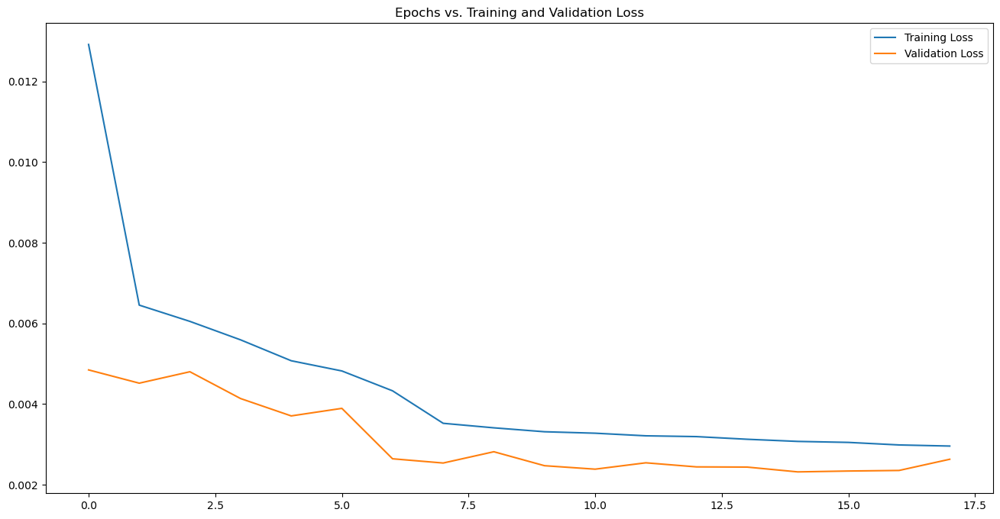

In [40]:
plot_model_loss(univariate_history)

In [41]:
# Valuta il modello
# loss = model.evaluate(X_test, y_test)
# print(f'Errore quadratico medio: {loss}')

# Fai previsioni per il test set
forecast = model.predict(X_test)

# Denormalizza le previsioni
uni_lstm_forecast = scaler.inverse_transform(forecast)



315/315 [==============================] - 7s 23ms/step - loss: 0.0023
Errore quadratico medio: 0.0023254037369042635
315/315 [==============================] - 8s 24ms/step


In [42]:
y_test_inv_uni = scaler.inverse_transform(y_test.squeeze(-1))
# y_test_inv_uni = scaler.inverse_transform(y_test)

In [447]:
# forflat = uni_lstm_forecast.flatten()

C:\Users\Giova\AppData\Local\Temp\ipykernel_22856\452371165.py:4: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
C:\Users\Giova\AppData\Local\Temp\ipykernel_22856\452371165.py:4: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
C:\Users\Giova\AppData\Local\Temp\ipykernel_22856\452371165.py:4: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
C:\Users\Giova\AppData\Local\Temp\ipykernel_22856\452371165.py:4: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
C:\Users\Giova\AppData\Local\Temp\ipykernel_22856\452371165.py:4: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
C:\Users\Giova\AppData\Local\Temp\ipykernel_22856\452371165.py:4: RuntimeWarning: divide by zero encountered i

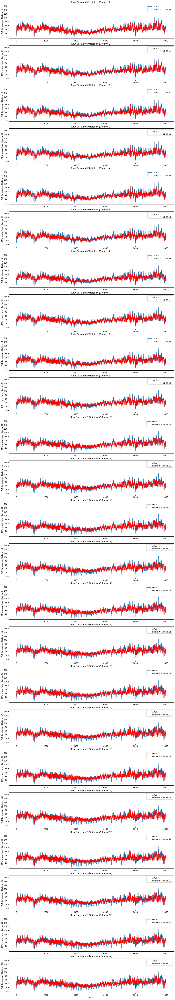

In [43]:
uni_table = evaluate_and_plot_timeseries(y_test_inv_uni, uni_lstm_forecast, show_plot=True)

Min NMAE: 0.085 for Column: 0.0
Min RMSE: 4.631 for Column: 0.0
Min MAPE: inf for Column: 0.0
(0.085, 4.631, inf)


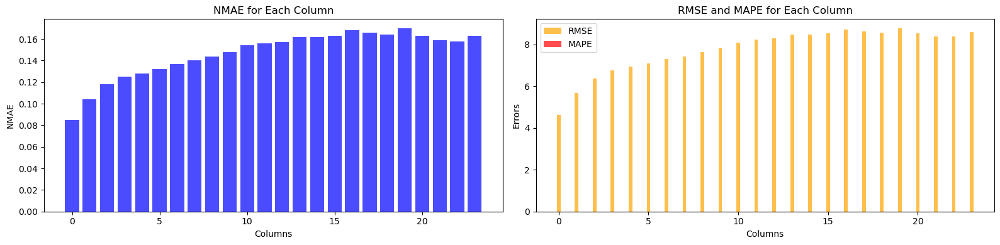

In [44]:
plot_error_metrics_barchart(uni_table)

### Hyperparaeters search

In [45]:
# !pip install -q keras_tuner

In [66]:
import keras_tuner as kt

# Define the model function
def build_model(hp):
  model = tf.keras.Sequential()
  # Choose the number of LSTM layers between 1 and 3
  for i in range(hp.Int('num_layers', min_value=1, max_value=3)):
    # Choose the number of LSTM units between 50 and 200
    # Check the value of num_layers to set return_sequences
    if hp.get('num_layers') == 1:
      model.add(LSTM(hp.Int('units_' + str(i), min_value=50, max_value=200, step=50), input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=False))
    else:
      model.add(LSTM(hp.Int('units_' + str(i), min_value=50, max_value=200, step=50), input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True))
    # Choose the dropout between 0 and 0.5
    model.add(Dropout(hp.Float('dropout_' + str(i), min_value=0, max_value=0.5, step=0.1)))
  # Add the output layer with one neuron for each hour to predict
  model.add(Dense(y_train.shape[1]))
  # Compile the model using adam as optimizer and mean_squared_error as loss function
  model.compile(optimizer='adam', loss='mean_squared_error')
  return model



In [103]:
tuner = kt.BayesianOptimization(build_model, objective='val_loss', max_trials=10, 
                                num_initial_points=2, beta=2.6, project_name='LSTM_tuning2')

tuner.search(X_train, y_train, epochs=40, batch_size=64, validation_split=0.2, callbacks = [early_stopping], verbose=2)
best_model = tuner.get_best_models()[0]

Trial 10 Complete [00h 02m 57s]
val_loss: 0.002373098162934184

Best val_loss So Far: 0.002373098162934184
Total elapsed time: 00h 24m 40s


In [104]:
# Get the best hyperparameters
best_hps = tuner.get_best_hyperparameters()[0]
# Print the values of each hyperparameter
print("Best number of layers:", best_hps.get("num_layers"))
print("Best number of units for layer 0:", best_hps.get("units_0"))
print("Best dropout for layer 0:", best_hps.get("dropout_0"))
# Repeat for the other layers if num_layers > 1


Best number of layers: 1
Best number of units for layer 0: 200
Best dropout for layer 0: 0.30000000000000004


In [ ]:
y_test_

In [105]:
tuned_forecast = best_model.predict(X_test)

# Denormalizza le previsioni
tuned_uni_lstm_forecast = scaler.inverse_transform(tuned_forecast)

317/317 [==============================] - 8s 15ms/step


In [106]:
y_test_inv_uni = scaler.inverse_transform(y_test.squeeze(-1))

In [111]:
null_indices = np.where(y_test_inv_uni[:,0] == 0)

In [118]:
y_test_inv_uni[null_indices, 0] = 5

C:\Users\Giova\AppData\Local\Temp\ipykernel_22856\452371165.py:4: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
C:\Users\Giova\AppData\Local\Temp\ipykernel_22856\452371165.py:4: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
C:\Users\Giova\AppData\Local\Temp\ipykernel_22856\452371165.py:4: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
C:\Users\Giova\AppData\Local\Temp\ipykernel_22856\452371165.py:4: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
C:\Users\Giova\AppData\Local\Temp\ipykernel_22856\452371165.py:4: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
C:\Users\Giova\AppData\Local\Temp\ipykernel_22856\452371165.py:4: RuntimeWarning: divide by zero encountered i

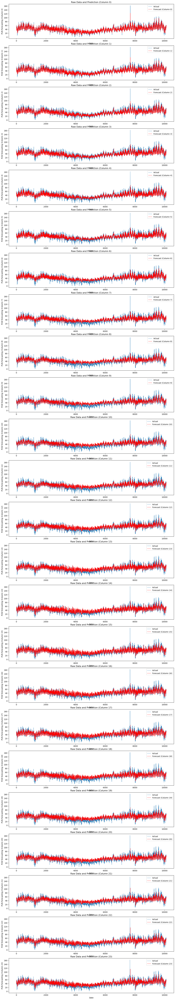

In [119]:
# y_test_inv_uni = scaler.inverse_transform(y_test)
uni_table = evaluate_and_plot_timeseries(y_test_inv_uni, tuned_uni_lstm_forecast, show_plot=True)

Min NMAE: 0.085 for Column: 0.0
Min RMSE: 4.556 for Column: 0.0
Min MAPE: 14.349 for Column: 0.0
(0.085, 4.556, 14.349)


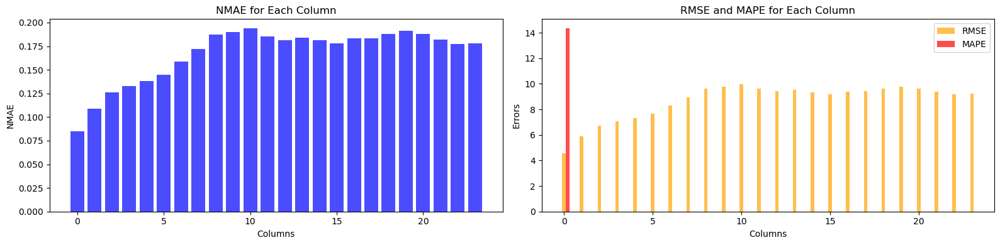

In [121]:
plot_error_metrics_barchart(uni_table)

### I/O values

#### Standard procedure 

In [184]:
df_total_load_f = df_total_load.iloc[:,:-1]

In [111]:
df.columns

Index(['PUN', 'PUN_d+1-7', 'PUN_d+1-14', 'GAS', 'GAS_d+1-7', 'Total_load_f',
       'Total_Load_d+1-7', 'GiornoSettimana', 'Ora', 'holiday'],
      dtype='object')

In [112]:
df_temp = df[['PUN','PUN_d+1-7','GAS','GiornoSettimana', 'Ora', 'holiday']]

In [113]:
dataset_input = df_temp

In [114]:
dataset_input['hour_sin'], dataset_input['hour_cos'] = transform_time_features(dataset_input['Ora'], 24)
dataset_input['day_sin'], dataset_input['day_cos'] = transform_time_features(dataset_input['GiornoSettimana'], 7)

C:\Users\Giova\AppData\Local\Temp\ipykernel_13696\1290972219.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_input['hour_sin'], dataset_input['hour_cos'] = transform_time_features(dataset_input['Ora'], 24)
C:\Users\Giova\AppData\Local\Temp\ipykernel_13696\1290972219.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_input['hour_sin'], dataset_input['hour_cos'] = transform_time_features(dataset_input['Ora'], 24)
C:\Users\Giova\AppData\Local\Temp\ipykernel_13696\1290972219.py:2: SettingWi

In [115]:
dataset_input.drop(['Ora', 'GiornoSettimana'], axis=1, inplace=True)

In [116]:
dataset_input

,PUN,PUN_d+1-7,GAS,holiday,hour_sin,hour_cos,day_sin,day_cos
Time_data,,,,,,,,
2018-01-15 00:00:00+00:00,41.56,39.17,21.14,0,2.588190e-01,0.965926,0.000000,1.00000
2018-01-15 01:00:00+00:00,35.15,36.40,21.14,0,5.000000e-01,0.866025,0.000000,1.00000
2018-01-15 02:00:00+00:00,32.55,35.90,21.14,0,7.071068e-01,0.707107,0.000000,1.00000
2018-01-15 03:00:00+00:00,32.78,34.00,21.14,0,8.660254e-01,0.500000,0.000000,1.00000
2018-01-15 04:00:00+00:00,32.55,35.35,21.14,0,9.659258e-01,0.258819,0.000000,1.00000
...,...,...,...,...,...,...,...,...
2023-11-07 19:00:00+00:00,167.02,158.11,42.15,0,-8.660254e-01,0.500000,0.781831,0.62349
2023-11-07 20:00:00+00:00,132.16,146.76,42.15,0,-7.071068e-01,0.707107,0.781831,0.62349
2023-11-07 21:00:00+00:00,127.06,121.55,42.15,0,-5.000000e-01,0.866025,0.781831,0.62349


In [120]:
def prepare_data(dataset_input, univariate=False):
    # Estrae la variabile target 'PUN'
    if univariate:
        X = dataset_input['PUN'].values.reshape(-1, 1)
    else:
        X = dataset_input.values

    y = dataset_input['PUN'].values.reshape(-1, 1)

    return X, y

In [133]:
target_size = 24
past_history = 24
train_size = 0.7
test_size = 0.3


In [131]:
train_index = int(len(dataset_input) * train_size)
test_index = train_index + int(len(dataset_input) * test_size)

X, y = prepare_data(dataset_input, univariate=False)

In [132]:
# Utilizza due scaler diversi per evitare bias
X_sc = MinMaxScaler()
y_sc = MinMaxScaler()

X_sc.fit(X[:train_index])
y_sc.fit(y[:train_index])

X_norm = X_sc.transform(X)
y_norm = y_sc.transform(y)


y_norm = y_norm.squeeze()


In [134]:
# Prepara i dati utilizzando la funzione multivariate_data
X_train, y_train = multivariate_data(X_norm, y_norm,
                                        0, train_index, past_history,
                                        target_size, step=step, single_step=False)

X_test, y_test = multivariate_data(X_norm, y_norm,
                                    train_index, test_index, past_history,
                                    target_size, step=step, single_step=False)

# Stampa le dimensioni dei dati
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)



X_train shape: (35280, 24, 8)
y_train shape: (35280, 24)
X_test shape: (15050, 24, 8)
y_test shape: (15050, 24)


In [135]:
y_test_inv = y_sc.inverse_transform(y_test)
input_shape = X_train.shape[-2:]


### LSTM

In [167]:
tf.keras.backend.clear_session()
multivariate_lstm = tf.keras.Sequential()

multivariate_lstm.add(LSTM(100, input_shape=input_shape, return_sequences=True)) 
multivariate_lstm.add(Dropout(0.2))

multivariate_lstm.add(LSTM(50, input_shape=input_shape, return_sequences=True)) 
multivariate_lstm.add(Dropout(0.2))

multivariate_lstm.add(LSTM(40, input_shape=input_shape, return_sequences=True)) 

multivariate_lstm.add(LSTM(40, input_shape=input_shape)) 
multivariate_lstm.add(Dropout(0.2))


multivariate_lstm.add(Activation(custom_activation,name = "Swish"))
multivariate_lstm.add(Dense(100))

multivariate_lstm.add(Dense(target_size))


multivariate_lstm.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 24, 100)           43600     
                                                                 
 dropout (Dropout)           (None, 24, 100)           0         
                                                                 
 lstm_1 (LSTM)               (None, 24, 50)            30200     
                                                                 
 dropout_1 (Dropout)         (None, 24, 50)            0         
                                                                 
 lstm_2 (LSTM)               (None, 24, 40)            14560     
                                                                 
 lstm_3 (LSTM)               (None, 40)                12960     
                                                                 
 dropout_2 (Dropout)         (None, 40)                0

In [168]:
# Callback per il salvataggio del modello
# lstm_checkpoint = ModelCheckpoint('multivariate_lstm_df_gas.h5', monitor='val_loss', save_best_only=True)

multivariate_lstm.compile(loss='mean_squared_error', optimizer='adam', metrics=[tf.keras.metrics.RootMeanSquaredError()]) 
# multivariate_lstm.compile(loss='mean_squared_error', optimizer=tf.keras.optimizers.SGD(1e-8, momentum=0.9) , metrics=[tf.keras.metrics.RootMeanSquaredError()]) 

# Vuole questa metrica altrimenti fa capricci con la stringa
# y_train = np.reshape(y_train, (y_train.shape[0], y_train.shape[1]), 1)


lr_schedule = tf.keras.callbacks.LearningRateScheduler(
            lambda epoch: 1e-5 * 10**(epoch/20))

early_stopping = EarlyStopping(monitor='val_loss', patience=10, min_delta=0.0002, restore_best_weights=True)


history = multivariate_lstm.fit(X_train, y_train, epochs=50, verbose=1,
                                validation_split=0.2, batch_size=64,
                                callbacks=[early_stopping, lr_schedule])

plot_model_rmse_and_loss(history)



Epoch 1/50
441/441 [==============================] - 44s 75ms/step - loss: 0.0061 - root_mean_squared_error: 0.0778 - val_loss: 0.0734 - val_root_mean_squared_error: 0.2709 - lr: 1.0000e-05
Epoch 2/50
441/441 [==============================] - 35s 78ms/step - loss: 0.0019 - root_mean_squared_error: 0.0432 - val_loss: 0.0616 - val_root_mean_squared_error: 0.2481 - lr: 1.1220e-05
Epoch 3/50
441/441 [==============================] - 33s 74ms/step - loss: 0.0014 - root_mean_squared_error: 0.0370 - val_loss: 0.0521 - val_root_mean_squared_error: 0.2281 - lr: 1.2589e-05
Epoch 4/50
441/441 [==============================] - 33s 75ms/step - loss: 0.0010 - root_mean_squared_error: 0.0323 - val_loss: 0.0287 - val_root_mean_squared_error: 0.1695 - lr: 1.4125e-05
Epoch 5/50
239/441 [===============>..............] - ETA: 14s - loss: 7.8195e-04 - root_mean_squared_error: 0.0280

KeyboardInterrupt: 

In [ ]:
winsound.Beep(1440, 800)

In [ ]:
# multivariate_lstm = tf.keras.models.load_model('multivariate_lstm.h5')

forecast = multivariate_lstm.predict(X_test)
lstm_forecast = y_sc.inverse_transform(forecast)


471/471 [==============================] - 7s 13ms/step


In [ ]:
lstm_forecast.shape

(15050, 50)

IndexError: index 24 is out of bounds for axis 1 with size 24

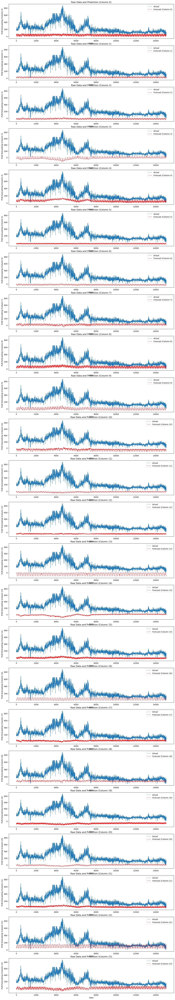

In [ ]:
lstm_table = evaluate_and_plot_timeseries(y_test_inv, lstm_forecast, show_plot=True)

Min NMAE: 0.171 for Column: 2.0
Min RMSE: 61.917 for Column: 2.0
Min MAPE: 20.439 for Column: 2.0
(0.171, 61.917, 20.439)


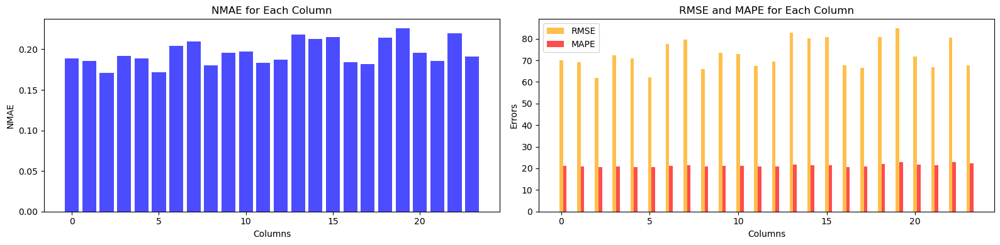

In [ ]:
plot_error_metrics_barchart(lstm_table)


### Encoder Decoder E1D1

E1D1 ==> Sequence to Sequence Model with one encoder layer and one decoder layer.


In [355]:
# E1D1
n_features = X_train.shape[2]

encoder_inputs = tf.keras.layers.Input(shape=(past_history, n_features))
encoder_l1 = tf.keras.layers.LSTM(100, return_state=True)
encoder_outputs1, state_h1, state_c1 = encoder_l1(encoder_inputs)
encoder_states1 = [state_h1, state_c1]

decoder_inputs = tf.keras.layers.RepeatVector(target_size)(encoder_outputs1)

decoder_l1 = tf.keras.layers.LSTM(100, return_sequences=True)(decoder_inputs, initial_state=encoder_states1)
decoder_outputs1 = tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(target_size))(decoder_l1)

model_e1d1 = tf.keras.models.Model(encoder_inputs, decoder_outputs1)

In [356]:
# E2D2
encoder_inputs = tf.keras.layers.Input(shape=(past_history, n_features))
encoder_l1 = tf.keras.layers.LSTM(100, return_sequences=True, return_state=True)
encoder_outputs1, state_h1, state_c1 = encoder_l1(encoder_inputs)
encoder_states1 = [state_h1, state_c1]

encoder_l2 = tf.keras.layers.LSTM(100, return_state=True)
encoder_outputs2, state_h2, state_c2 = encoder_l2(encoder_outputs1)
encoder_states2 = [state_h2, state_c2]

decoder_inputs = tf.keras.layers.RepeatVector(target_size)(encoder_outputs2)

decoder_l1 = tf.keras.layers.LSTM(100, return_sequences=True)(decoder_inputs, initial_state=encoder_states1)
decoder_l2 = tf.keras.layers.LSTM(100, return_sequences=True)(decoder_l1, initial_state=encoder_states2)
decoder_outputs2 = tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(target_size))(decoder_l2)

model_e2d2 = tf.keras.models.Model(encoder_inputs, decoder_outputs2)

In [327]:
# Modifica per aggiungere una dimensione per la lunghezza della sequenza temporale
y_train_ed = np.expand_dims(y_train, axis=-1)

In [357]:
model_e1d1.compile(optimizer='adam', loss='mean_squared_error')

history_e1d1 = model_e1d1.fit(X_train, y_train_ed, epochs=25,
                            validation_split=0.2, batch_size=32,
                            verbose=1, callbacks=[early_stopping])

model_e2d2.compile(optimizer='adam', loss='mean_squared_error')

history_e2d2 = model_e2d2.fit(X_train, y_train_ed, epochs=25,
                            validation_split=0.2, batch_size=32,
                            verbose=1, callbacks=[early_stopping])


Epoch 1/25
442/442 [==============================] - 39s 65ms/step - loss: 0.0031 - val_loss: 0.0052
Epoch 2/25
442/442 [==============================] - 26s 59ms/step - loss: 0.0018 - val_loss: 0.0050
Epoch 3/25
442/442 [==============================] - 23s 53ms/step - loss: 0.0015 - val_loss: 0.0036
Epoch 4/25
442/442 [==============================] - 23s 52ms/step - loss: 0.0011 - val_loss: 0.0033
Epoch 5/25
442/442 [==============================] - 23s 51ms/step - loss: 0.0010 - val_loss: 0.0031
Epoch 6/25
442/442 [==============================] - 20s 46ms/step - loss: 9.6074e-04 - val_loss: 0.0034
Epoch 7/25
442/442 [==============================] - 21s 47ms/step - loss: 9.3676e-04 - val_loss: 0.0032
Epoch 8/25
442/442 [==============================] - 31s 70ms/step - loss: 8.9290e-04 - val_loss: 0.0032
Epoch 9/25
442/442 [==============================] - 21s 48ms/step - loss: 8.7778e-04 - val_loss: 0.0031
Epoch 10/25
442/442 [==============================] - 21s 47ms/st

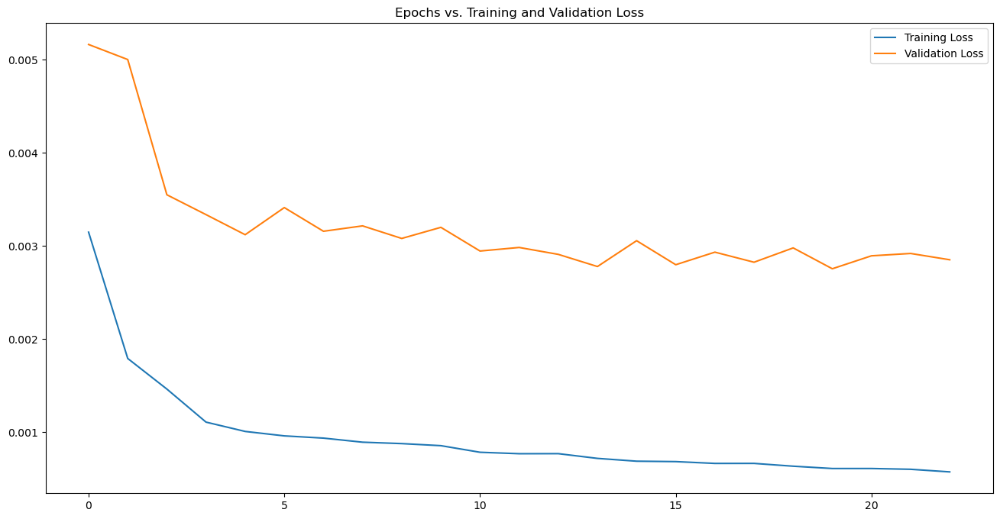

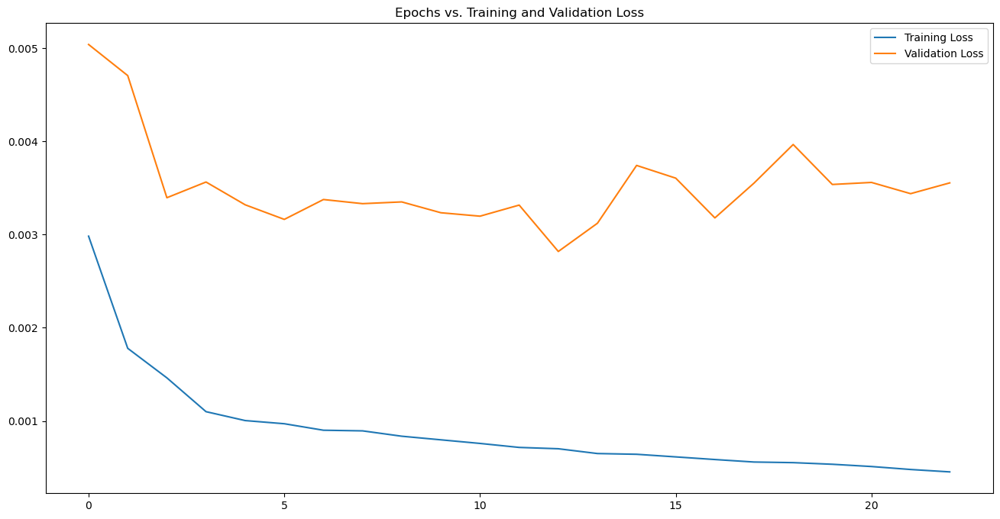

In [358]:
plot_model_loss(history_e1d1)
plot_model_loss(history_e2d2)

In [383]:
forecast_ed1 = model_e1d1.predict(X_test)
forecast_ed2 = model_e2d2.predict(X_test)

winsound.Beep(1500,800)

235/235 [==============================] - 7s 30ms/step


In [384]:
forecast_ed1[:,:,0]=y_sc.inverse_transform(forecast_ed1[:,:,0])
forecast_ed2[:,:,0]=y_sc.inverse_transform(forecast_ed2[:,:,0])

# life hack: ctrl + d per selezionare tutte le occorrenze di un determinato carattere

Min NMAE: 0.094 for Column: 0.0
Min RMSE: 17.207 for Column: 0.0
Min MAPE: 13.957 for Column: 0.0
(0.094, 17.207, 13.957)


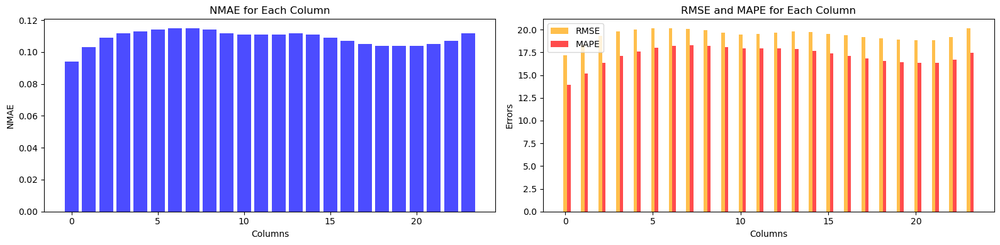

In [385]:
lstm2_table = evaluate_and_plot_timeseries(y_test_inv, forecast_ed1[:,:,0], show_plot=False)
plot_error_metrics_barchart(lstm2_table)

### CNN-LSTM

In [276]:
tf.keras.backend.clear_session()

multivariate_cnn_lstm = tf.keras.models.Sequential([
    Conv1D(filters=64, kernel_size=6,
           strides=1, padding='causal',
           activation='relu', 
           input_shape=input_shape),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),
    LSTM(250, return_sequences=True),
    Dropout(0.2),
    Flatten(),
    Dense(future_target)
])

In [947]:
tf.keras.backend.clear_session()

multivariate_cnn_lstm = tf.keras.models.Sequential([
    ConvLSTM1D(filters=32, kernel_size=6, padding='causal',
           activation='relu',
           data_format='channels_last', dropout=0.2),
    Flatten(),
    Dense(future_target)
])

In [277]:
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
                   'multivariate_cnn_lstm_df.h5', save_best_only=True)
optimizer = tf.keras.optimizers.Adam(learning_rate=4e-4, amsgrad=True)

multivariate_cnn_lstm.compile(loss=loss,
                          optimizer=optimizer,
                          metrics=metric)

Epoch 1/30


631/631 [==============================] - 21s 27ms/step - loss: 0.0036 - root_mean_squared_error: 0.0602 - val_loss: 0.0198 - val_root_mean_squared_error: 0.1408
Epoch 2/30
  1/631 [..............................] - ETA: 20s - loss: 0.0603 - root_mean_squared_error: 0.2456

c:\Users\Giova\anaconda3_new\Lib\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


631/631 [==============================] - 17s 26ms/step - loss: 0.0047 - root_mean_squared_error: 0.0688 - val_loss: 0.0208 - val_root_mean_squared_error: 0.1442
Epoch 3/30
631/631 [==============================] - 16s 26ms/step - loss: 0.0047 - root_mean_squared_error: 0.0688 - val_loss: 0.0234 - val_root_mean_squared_error: 0.1530
Epoch 4/30
631/631 [==============================] - 20s 32ms/step - loss: 0.0046 - root_mean_squared_error: 0.0676 - val_loss: 0.0284 - val_root_mean_squared_error: 0.1686
Epoch 5/30
631/631 [==============================] - 21s 34ms/step - loss: 0.0043 - root_mean_squared_error: 0.0655 - val_loss: 0.0273 - val_root_mean_squared_error: 0.1652
Epoch 6/30
631/631 [==============================] - 16s 26ms/step - loss: 0.0040 - root_mean_squared_error: 0.0633 - val_loss: 0.0257 - val_root_mean_squared_error: 0.1603
Epoch 7/30
631/631 [==============================] - 16s 26ms/step - loss: 0.0035 - root_mean_squared_error: 0.0590 - val_loss: 0.0215 - val

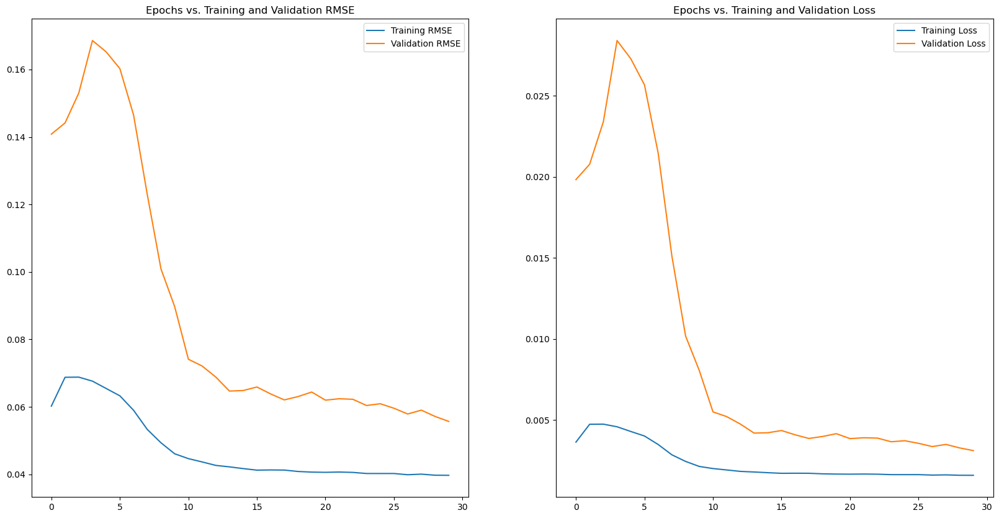

In [278]:
# !pip install pydot
# !pip install graphviz
# tf.keras.utils.plot_model(multivariate_cnn_lstm, show_shapes=True)

history_cnn = multivariate_cnn_lstm.fit(train, epochs=30,
                                    validation_data=validation,
                                    callbacks=[early_stopping,
                                               model_checkpoint])

                                               
plot_model_rmse_and_loss(history_cnn)   

# multivariate_lstm = tf.keras.models.load_model('multivariate_lstm.h5')


In [279]:
cnn_lstm_forecast = multivariate_cnn_lstm.predict(X_test)
cnn_lstm_forecast = y_sc.inverse_transform(cnn_lstm_forecast)

156/156 [==============================] - 3s 13ms/step


    Column     MAE    RMSE    MAPE   NMAE
0        0  27.931  32.315  35.377  0.243
1        1  28.510  32.885  36.113  0.248
2        2  26.986  31.583  34.433  0.235
3        3  26.742  31.482  34.242  0.233
4        4  26.694  31.523  34.232  0.232
5        5  26.819  31.664  34.219  0.234
6        6  27.010  31.740  34.263  0.235
7        7  26.480  31.164  33.679  0.231
8        8  27.467  32.063  34.780  0.239
9        9  27.711  32.381  35.101  0.241
10      10  28.297  32.951  35.661  0.246
11      11  28.586  33.261  35.892  0.249
12      12  29.160  33.805  36.378  0.254
13      13  28.859  33.486  35.831  0.251
14      14  28.412  33.101  35.462  0.247
15      15  27.826  32.554  35.019  0.242
16      16  27.591  32.377  35.030  0.240
17      17  27.582  32.395  35.112  0.240
18      18  26.965  31.722  34.322  0.235
19      19  26.983  31.711  34.037  0.235
20      20  26.634  31.492  33.545  0.232
21      21  26.909  31.760  33.833  0.234
22      22  26.589  31.491  33.547

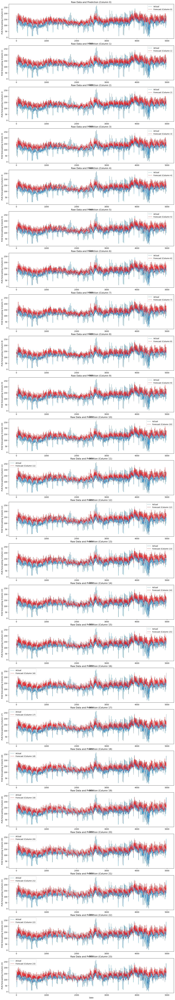

In [280]:
evaluate_and_plot_timeseries(y_test_inv, cnn_lstm_forecast, show_plot=True)

### XGBoost

In [119]:
dataset_input = df_PUN

# Divisione in training, validation e test set
train_index = int(len(dataset_input) * 0.6)
cv_index = train_index + int(len(dataset_input) * 0.15)
test_index = train_index + int(len(dataset_input) * 0.25)


X_train, y_train = multivariate_data(X_norm, y_norm,
                                     0, train_index, past_history, 
                                     future_target, step=step, single_step=False)

X_val, y_val = multivariate_data(X_norm, y_norm,
                                 train_index, cv_index, past_history, 
                                 future_target, step=step, single_step=False)

X_test, y_test = multivariate_data(X_norm, y_norm,
                                   cv_index, test_index, past_history, 
                                   future_target, step=step, single_step=False)


# y_test = y_test.reshape(-1, 1) # questo se single step = True
y_test_inv = y_sc.inverse_transform(y_test)

X_train_xgb = X_train.reshape(-1, X_train.shape[1] * X_train.shape[2])
X_val_xgb = X_val.reshape(-1, X_val.shape[1] * X_val.shape[2])
X_test_xgb = X_test.reshape(-1, X_test.shape[1] * X_test.shape[2])

IndexError: index 15134 is out of bounds for axis 0 with size 8016

#### Xgb train with "rndm" parameters

In [112]:
param = {'eta': 0.5, 'max_depth': 50, 
         'subsample': 0.9, 'colsample_bytree': 0.95, 
         'alpha': 0.1, 'lambda': 0.15, 'gamma': 0.1,
         'objective': 'reg:linear', 'eval_metric': 'rmse', 
         'silent': 1, 'min_child_weight': 0.1, 'n_jobs': -1}

dtrain = xgb.DMatrix(X_train_xgb, y_train)
dval = xgb.DMatrix(X_val_xgb, y_val)
dtest = xgb.DMatrix(X_test_xgb, y_test)

eval_list = [(dtrain, 'train'), (dval, 'eval')]

'''lambda [default=1, alias: reg_lambda]
L2 regularization term on weights (analogous to Ridge regression). 
This is used to handle the regularization part of XGBoost. 


alpha [default=0, alias: reg_alpha]
L1 regularization term on weights (analogous to Lasso regression).
'''

'lambda [default=1, alias: reg_lambda]\nL2 regularization term on weights (analogous to Ridge regression). \nThis is used to handle the regularization part of XGBoost. \n\n\nalpha [default=0, alias: reg_alpha]\nL1 regularization term on weights (analogous to Lasso regression).\n'

In [113]:
# for hyperparameters tuning see  Bayesian Optimization with HYPEROPT.
xgb_model = xgb.train(param, dtrain, 200, eval_list, early_stopping_rounds=10)

c:\Users\Giova\anaconda3_new\Lib\site-packages\xgboost\core.py:726: FutureWarning: Pass `evals` as keyword args.
  warnings.warn(msg, FutureWarning)
c:\Users\Giova\anaconda3_new\Lib\site-packages\xgboost\core.py:160: UserWarning: [12:51:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0cec3277c4d9d0165-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:209: reg:linear is now deprecated in favor of reg:squarederror.
  warnings.warn(smsg, UserWarning)
c:\Users\Giova\anaconda3_new\Lib\site-packages\xgboost\core.py:160: UserWarning: [12:51:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0cec3277c4d9d0165-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "silent" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.08860	eval-rmse:0.07702
[1]	train-rmse:0.07248	eval-rmse:0.05998
[2]	train-rmse:0.06698	eval-rmse:0.05425
[3]	train-rmse:0.06498	eval-rmse:0.05246
[4]	train-rmse:0.06420	eval-rmse:0.05170
[5]	train-rmse:0.06381	eval-rmse:0.05141
[6]	train-rmse:0.06368	eval-rmse:0.05136
[7]	train-rmse:0.06362	eval-rmse:0.05134
[8]	train-rmse:0.06361	eval-rmse:0.05134
[9]	train-rmse:0.06358	eval-rmse:0.05133
[10]	train-rmse:0.06358	eval-rmse:0.05133
[11]	train-rmse:0.06358	eval-rmse:0.05133
[12]	train-rmse:0.06357	eval-rmse:0.05131
[13]	train-rmse:0.06357	eval-rmse:0.05132
[14]	train-rmse:0.06355	eval-rmse:0.05131
[15]	train-rmse:0.06355	eval-rmse:0.05130
[16]	train-rmse:0.06352	eval-rmse:0.05130
[17]	train-rmse:0.06352	eval-rmse:0.05130
[18]	train-rmse:0.06352	eval-rmse:0.05130
[19]	train-rmse:0.06352	eval-rmse:0.05131
[20]	train-rmse:0.06351	eval-rmse:0.05128
[21]	train-rmse:0.06351	eval-rmse:0.05129
[22]	train-rmse:0.06351	eval-rmse:0.05129
[23]	train-rmse:0.06351	eval-rmse:0.05128
[2

In [114]:
forecast = xgb_model.predict(dtest)
# xgb_forecast = forecast.reshape(-1, 1)

xgb_forecast_inv = y_sc.inverse_transform(forecast)

In [115]:
print(y_test_inv.shape)
print(forecast.shape)
print(xgb_forecast_inv.shape)
print(f'DMatrix rows: {dtest.num_row()}, columns: {dtest.num_col()}')



(802, 24)
(802, 24)
(802, 24)
DMatrix rows: 802, columns: 24


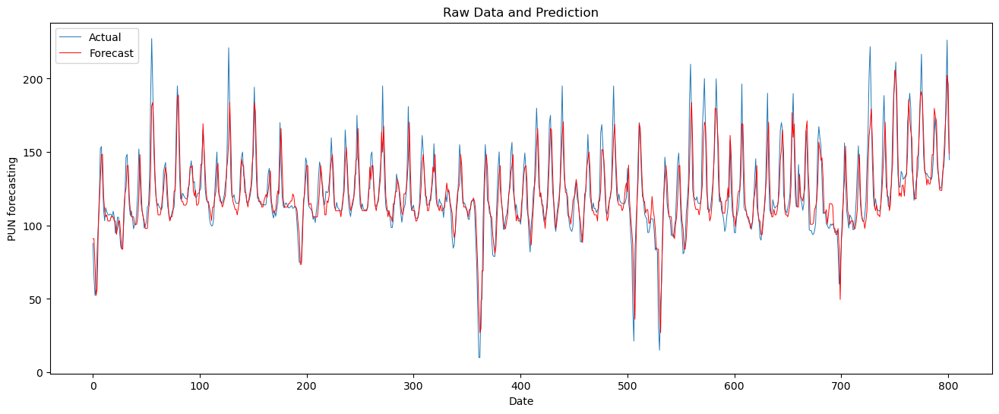

In [116]:
plt.figure(figsize=(16, 6))
plt.plot(y_test_inv[:,0], linewidth=0.7, label='Actual')
plt.plot(xgb_forecast_inv[:,0], linewidth=0.7, color='r', label='Forecast')

plt.xlabel('Date')
plt.ylabel('PUN forecasting')
plt.title('Raw Data and Prediction')
plt.legend()
plt.show()

In [117]:
xgboost_table = evaluate_and_plot_timeseries(y_test_inv, xgb_forecast_inv, show_plot=False)


Min NMAE: 0.072 for Column: 0.0
Min RMSE: 12.614 for Column: 0.0
Min MAPE: 8.291 for Column: 0.0


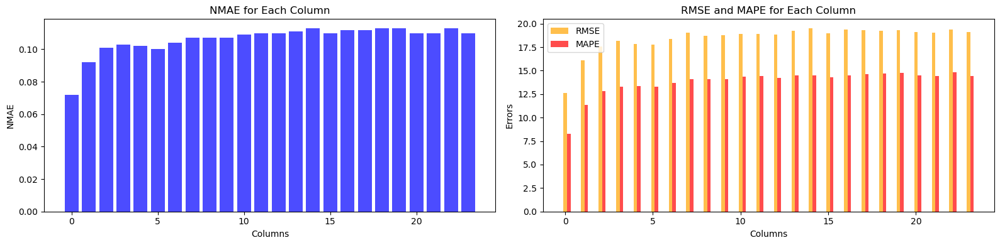

In [118]:
plot_error_metrics_barchart(xgboost_table)

#### XGB regressor

In [697]:
from xgboost import XGBRegressor


xgb_model_sklearn = XGBRegressor(
    learning_rate=0.5,
    max_depth=50,
    subsample=0.9,
    colsample_bytree=0.95,
    alpha=0.1,
    reg_lambda=0.15,
    gamma=0.1,
    objective='reg:squarederror',  # 'reg:linear' è deprecato, 'reg:squarederror' è l'opzione attuale
    n_jobs=-1,
    n_estimators=200,
)

# Addestramento del modello
xgb_model_sklearn.fit(X_train_xgb, y_train, eval_metric='rmse', eval_set=[(X_train_xgb, y_train), (X_val_xgb, y_val)], early_stopping_rounds=10)


c:\Users\Giova\anaconda3_new\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\Giova\anaconda3_new\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-rmse:0.08954	validation_1-rmse:0.06248
[1]	validation_0-rmse:0.05249	validation_1-rmse:0.04695
[2]	validation_0-rmse:0.03689	validation_1-rmse:0.04052
[3]	validation_0-rmse:0.03098	validation_1-rmse:0.03803
[4]	validation_0-rmse:0.02897	validation_1-rmse:0.03711
[5]	validation_0-rmse:0.02817	validation_1-rmse:0.03656
[6]	validation_0-rmse:0.02782	validation_1-rmse:0.03625
[7]	validation_0-rmse:0.02768	validation_1-rmse:0.03610
[8]	validation_0-rmse:0.02763	validation_1-rmse:0.03606
[9]	validation_0-rmse:0.02761	validation_1-rmse:0.03603
[10]	validation_0-rmse:0.02758	validation_1-rmse:0.03600
[11]	validation_0-rmse:0.02757	validation_1-rmse:0.03600
[12]	validation_0-rmse:0.02757	validation_1-rmse:0.03600
[13]	validation_0-rmse:0.02757	validation_1-rmse:0.03600
[14]	validation_0-rmse:0.02757	validation_1-rmse:0.03600
[15]	validation_0-rmse:0.02757	validation_1-rmse:0.03600
[16]	validation_0-rmse:0.02757	validation_1-rmse:0.03600
[17]	validation_0-rmse:0.02757	validation

XGBRegressor(alpha=0.1, base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.95, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.1, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.5, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=50, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=200, n_jobs=-1,
             num_parallel_tree=None, ...)

In [698]:

# Predizione sui dati di test
xgb_forecast_sklearn = xgb_model_sklearn.predict(X_test_xgb)


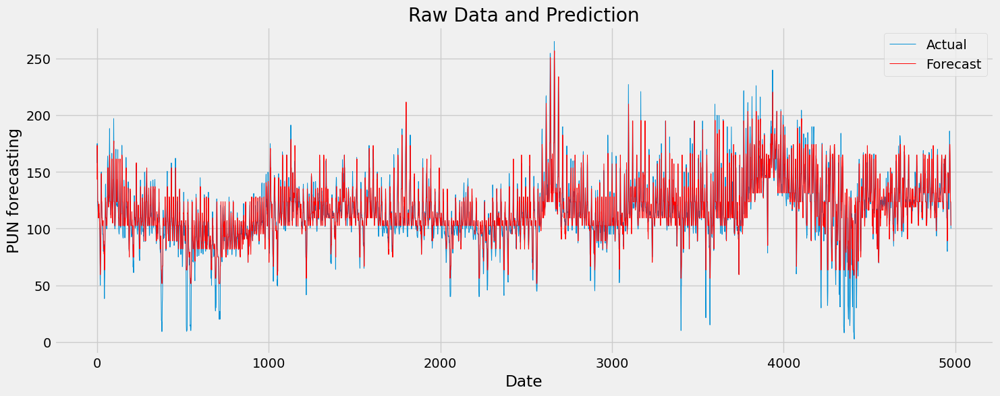

In [699]:

# Denormalizzazione delle previsioni
xgb_forecast_inv_sklearn = y_sc.inverse_transform(xgb_forecast_sklearn)

# Plot dei risultati
plt.figure(figsize=(16, 6))
plt.plot(y_test_inv[:,0], linewidth=0.7, label='Actual')
plt.plot(xgb_forecast_inv_sklearn[:,0], linewidth=0.7, color='r', label='Forecast')

plt.xlabel('Date')
plt.ylabel('PUN forecasting')
plt.title('Raw Data and Prediction')
plt.legend()
plt.show()




In [702]:
evaluate_and_plot_timeseries(y_test_inv, xgb_forecast_inv_sklearn)


    Column     MAE    RMSE    MAPE   NMAE
0        0   8.587  12.014  11.744  0.075
1        1  12.576  17.885  17.155  0.109
2        2  13.351  18.850  18.391  0.116
3        3  13.386  18.738  18.456  0.117
4        4  13.420  18.716  18.350  0.117
5        5  12.941  18.207  18.256  0.113
6        6  13.647  18.946  18.377  0.119
7        7  12.841  18.062  18.028  0.112
8        8  13.214  18.484  18.304  0.115
9        9  12.540  17.610  17.333  0.109
10      10  13.147  18.298  18.069  0.114
11      11  13.417  18.899  17.914  0.117
12      12  13.301  18.575  18.413  0.116
13      13  13.466  18.768  18.505  0.117
14      14  13.517  18.816  18.230  0.118
15      15  13.241  18.441  18.071  0.115
16      16  13.561  18.747  18.542  0.118
17      17  13.737  19.136  18.952  0.120
18      18  13.174  18.463  18.175  0.115
19      19  13.294  18.644  18.064  0.116
20      20  13.290  18.677  18.299  0.116
21      21  13.211  18.273  18.001  0.115
22      22  13.442  18.810  18.450

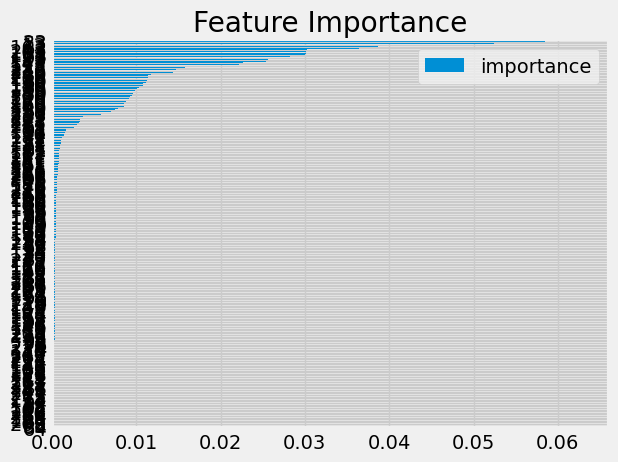

In [707]:
features_importance = pd.DataFrame(data=xgb_model_sklearn.feature_importances_,
            columns=['importance'])
features_importance.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()

#### Xgb.regressor w/ features importance

XGBoost provides a way to examine the importance of each feature in the original dataset within the model.

It involves counting the number of times each feature is split on across all boosting trees in the model.

Then we visualize the result as a bar graph, with the features ordered according to how many times they appear.

XGBoost has a plot_importance() function that helps us to achieve this task.

Then we can visualize the features that has been given the highest important score among all the features.

Thus XGBoost provides us a way to do feature selection.


In [667]:
train_size = 0.8
test_size = 0.2

# Esegui la suddivisione
df_train, df_test = train_test_split(df_2021_22, train_size=train_size, test_size=test_size, shuffle=False)

# "shuffle=False" garantisce che i dati rimangano nell'ordine originale

In [669]:
features = ['PUN_d+1-7', 'PUN_d+1-14', 'GAS', 'GAS_d+1-7',"Total_load_f", "Total_Load_d+1-7", 'GiornoSettimana', 'Ora', 'holiday']
target = 'PUN'

X_train = df_train[features]
y_train = df_train[target]

X_test = df_test[features]
y_test = df_test[target]

In [676]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error
color_pal = sns.color_palette()
plt.style.use('fivethirtyeight')


reg = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                       n_estimators=5000,
                       early_stopping_rounds=50,
                       objective='reg:squarederror',
                       max_depth=5,
                       learning_rate=0.1)



reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=100)

[0]	validation_0-rmse:202.19995	validation_1-rmse:332.60232
[100]	validation_0-rmse:16.99155	validation_1-rmse:71.96559
[200]	validation_0-rmse:13.30813	validation_1-rmse:71.71323
[300]	validation_0-rmse:11.36914	validation_1-rmse:71.59123
[357]	validation_0-rmse:10.48083	validation_1-rmse:71.70697


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=5000, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

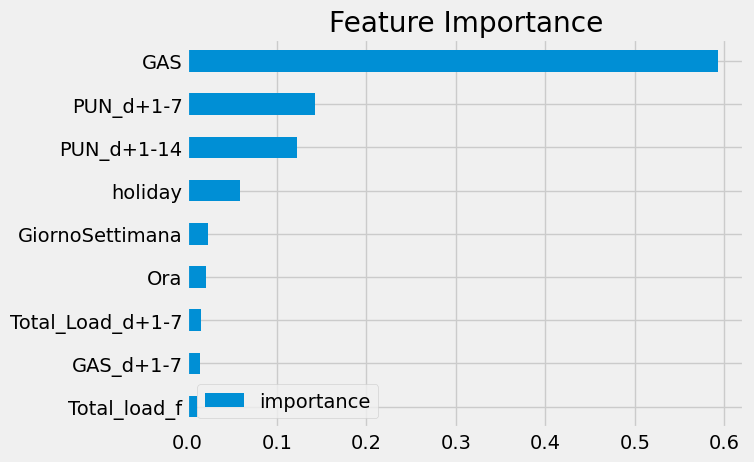

In [671]:
features_importance = pd.DataFrame(data=reg.feature_importances_,
            index=reg.feature_names_in_,
            columns=['importance'])
features_importance.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()

In [186]:
# df_2023.drop(columns='prediction', inplace=True)
# df_2021_22.drop(columns='prediction', inplace=True)


In [672]:
df_test['prediction'] = reg.predict(X_test)
df_2021_22 = df_2021_22.merge(df_test[['prediction']], how='left', left_index=True, right_index=True)

In [674]:
y_test.shape

(3442,)

In [673]:
single_timeseries_evaluation_metrics_func(df_test['prediction'].values, y_test)

Evaluation metric results:-
MAE is : 52.284
RMSE is : 71.555
MAPE is : 16.796
NMAE is : 0.157


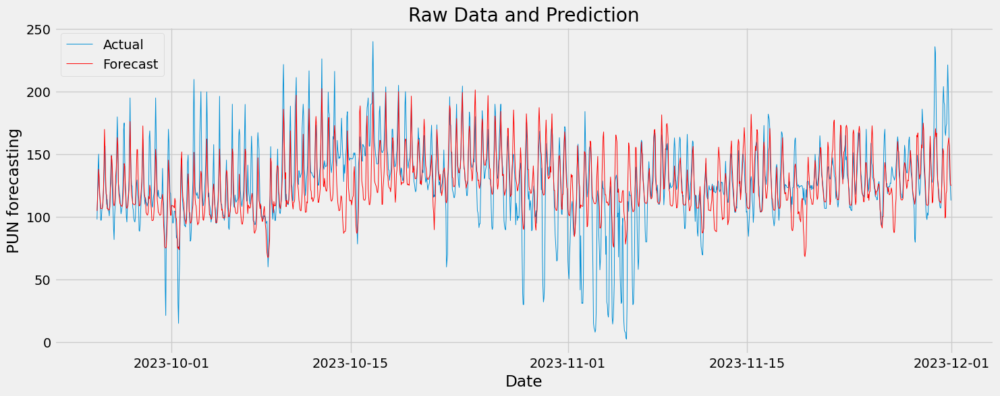

In [185]:
plt.figure(figsize=(16, 6))
plt.plot(df_test['PUN'], linewidth=0.7, label='Actual')
plt.plot(df_test['prediction'], linewidth=0.7, color='r', label='Forecast')

plt.xlabel('Date')
plt.ylabel('PUN forecasting')
plt.title('Raw Data and Prediction')
plt.legend()
plt.show()



49/49 [==============================] - 5s 81ms/step


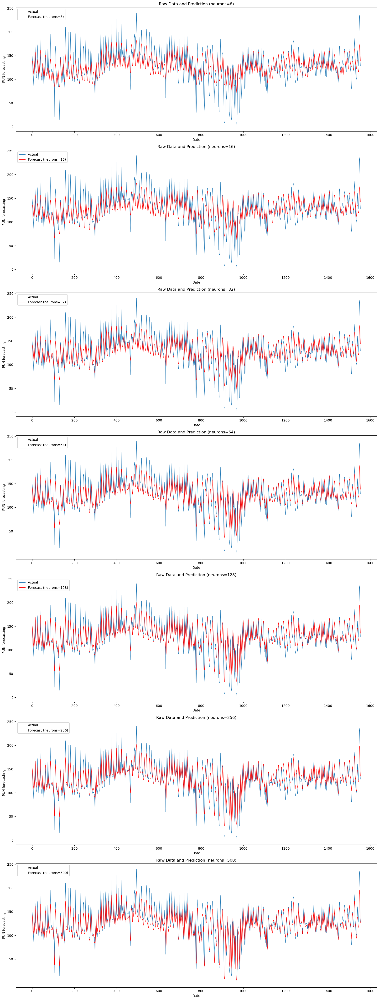

In [385]:
# Definisci la funzione timeseries_evaluation_metrics_func
def timeseries_evaluation_metrics_func(y_true, y_pred):
    def mean_absolute_percentage_error(y_true, y_pred):
        mask = y_true != 0
        y_true_masked = y_true[mask]
        y_pred_masked = y_pred[mask]
        return np.mean(np.abs((y_true_masked - y_pred_masked) / y_true_masked)) * 100

    def normalize_mean_absolute_error(y_true, y_pred):
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return metrics.mean_absolute_error(y_true, y_pred)/np.mean(np.abs(y_true))

    mse_values = []
    mae_values = []
    rmse_values = []
    mape_values = []
    nmae_values = []
    dec = 3  # cifre decimali

    for col_idx in range(y_true.shape[1]):
        col_true = y_true[:, col_idx]
        col_pred = y_pred[:, col_idx]

        mse_values.append(metrics.mean_squared_error(col_true, col_pred))
        mae_values.append(metrics.mean_absolute_error(col_true, col_pred))
        rmse_values.append(np.sqrt(metrics.mean_squared_error(col_true, col_pred)))
        mape_values.append(mean_absolute_percentage_error(col_true, col_pred))
        nmae_values.append(NMAE_error(col_true, col_pred))

    mse_avg = round(np.mean(mse_values), dec)
    mae_avg = round(np.mean(mae_values), dec)
    rmse_avg = round(np.mean(rmse_values), dec)
    mape_avg = round(np.mean(mape_values), dec)
    nmae_avg = round(np.mean(nmae_values), dec)

    return mse_avg, mae_avg, rmse_avg, mape_avg, nmae_avg

# Definisci la lista di neuroni
n_neurons_list = [8, 16, 32, 64, 128, 256, 500]

# Inizializza le liste per memorizzare gli errori
mse_values = []
mae_values = []
rmse_values = []
mape_values = []
nmae_values = []

# Crea il plot con subplot
fig, axes = plt.subplots(nrows=len(n_neurons_list), ncols=1, figsize=(16, 6 * len(n_neurons_list)))

for i, n_neurons in enumerate(n_neurons_list):
    tf.keras.backend.clear_session()
    
    multivariate_lstm = tf.keras.models.Sequential()
    multivariate_lstm.add(LSTM(n_neurons, input_shape=input_shape))
    multivariate_lstm.add(Dropout(0.2))
    multivariate_lstm.add(Dense(future_target, activation='relu'))
    
    multivariate_lstm.compile(loss='mean_squared_error', optimizer='adam', metrics=[tf.keras.metrics.RootMeanSquaredError()]) 
    
    history = multivariate_lstm.fit(train, epochs=50, verbose=0,
                                    validation_data=validation,
                                    callbacks=[early_stopping])
    
    forecast = multivariate_lstm.predict(X_test)
    lstm_forecast = y_sc.inverse_transform(forecast)
    
    # Calcola e memorizza gli errori
    mse_avg, mae_avg, rmse_avg, mape_avg, nmae_avg = timeseries_evaluation_metrics_func(y_test_inv, lstm_forecast)
    mse_values.append(mse_avg)
    mae_values.append(mae_avg)
    rmse_values.append(rmse_avg)
    mape_values.append(mape_avg)
    nmae_values.append(nmae_avg)
    
    # Plot
    axes[i].plot(y_test_inv[:, 0], linewidth=0.7, label='Actual')
    axes[i].plot(lstm_forecast[:, 0], linewidth=0.7, color='r', label=f'Forecast (neurons={n_neurons})')
    
    axes[i].set_xlabel('Date')
    axes[i].set_ylabel('PUN forecasting')
    axes[i].set_title(f'Raw Data and Prediction (neurons={n_neurons})')
    axes[i].legend()

# Mostra il plot
plt.tight_layout()
plt.show()


In [386]:
error_table = pd.DataFrame({'Neurons': n_neurons_list, 
                            'MSE': mse_values, 
                            'MAE': mae_values, 
                            'RMSE': rmse_values, 
                            'MAPE': mape_values, 
                            'NMAE': nmae_values})

print(error_table)

   Neurons      MSE     MAE    RMSE    MAPE   NMAE
0        8  525.243  16.751  22.902  25.535  0.132
1       16  483.926  16.086  21.983  23.935  0.126
2       32  467.345  15.820  21.585  23.341  0.124
3       64  449.834  15.499  21.159  22.376  0.122
4      128  444.809  15.318  21.023  22.607  0.120
5      256  456.730  15.234  21.292  23.584  0.120
6      500  475.405  15.834  21.711  22.524  0.124


## Try 2 

In [248]:
def window_dataset(data, n_steps, n_horizon, batch_size, shuffle_buffer, multi_var=False, expand_dims=False):
    """ Create a windowed tensorflow dataset
    
    """

    #create a window with n steps back plus the size of the prediction length
    window = n_steps + n_horizon
    
    #expand dimensions to 3D to fit with LSTM inputs
    #creat the inital tensor dataset
    if expand_dims:
        ds = tf.expand_dims(data, axis=-1)
        ds = tf.data.Dataset.from_tensor_slices(ds)
    else:
        ds = tf.data.Dataset.from_tensor_slices(data)
    
    #create the window function shifting the data by the prediction length
    ds = ds.window(window, shift=n_horizon, drop_remainder=True)
    
    #flatten the dataset and batch into the window size
    ds = ds.flat_map(lambda x : x.batch(window))
    ds = ds.shuffle(shuffle_buffer)    
    
    #create the supervised learning problem x and y and batch
    if multi_var:
        ds = ds.map(lambda x : (x[:-n_horizon], x[-n_horizon:, :1]))
    else:
        ds = ds.map(lambda x : (x[:-n_horizon], x[-n_horizon:]))
    
    ds = ds.batch(batch_size).prefetch(1)
    
    return ds

tf.random.set_seed(42)

n_steps = 24
n_horizon = 24
batch_size = 1
shuffle_buffer = 100


ds = window_dataset(train_multi, n_steps, n_horizon, batch_size, shuffle_buffer, multi_var=True)

print('Example sample shapes')
for idx,(x,y) in enumerate(ds):
    print("x = ", x.numpy().shape)
    print("y = ", y.numpy().shape)
    break

Example sample shapes
x =  (1, 24, 10)
y =  (1, 24, 1)


In [249]:
print(f"Train Data Shape: {train_multi.shape}")
print(f"Val Data Shape: {val_multi.shape}")
print(f"Test Data Shape: {test_multi.shape}")

Train Data Shape: (10701, 10)
Val Data Shape: (5763, 10)
Test Data Shape: (8760, 10)


In [ ]:
def build_dataset(train_fraq=0.65, 
                  n_steps=24*30, 
                  n_horizon=24, 
                  batch_size=256, 
                  shuffle_buffer=500, 
                  expand_dims=False,
                  multi_var=False):
    """If multi variate then first column is always the column from which the target is contstructed.
    """
    
    tf.random.set_seed(23)
    
    if multi_var:
        mm = MinMaxScaler()
        data = mm.fit_transform(data)
    
    train_data, val_data, test_data = split_data(data, train_fraq=train_fraq, test_len=8760)
    
    train_ds = window_dataset(train_data, n_steps, n_horizon, batch_size, shuffle_buffer, multi_var=multi_var, expand_dims=expand_dims)
    val_ds = window_dataset(val_data, n_steps, n_horizon, batch_size, shuffle_buffer, multi_var=multi_var, expand_dims=expand_dims)
    test_ds = window_dataset(test_data, n_steps, n_horizon, batch_size, shuffle_buffer, multi_var=multi_var, expand_dims=expand_dims)
    
    
    print(f"Prediction lookback (n_steps): {n_steps}")
    print(f"Prediction horizon (n_horizon): {n_horizon}")
    print(f"Batch Size: {batch_size}")
    print("Datasets:")
    print(train_ds.element_spec)
    
    return train_ds, val_ds, test_ds

train_ds, val_ds, test_ds = build_dataset(multi_var=True)